<a href="https://colab.research.google.com/github/YiqiuLu-201886416/Final-Assignment/blob/main/Final_Project_201886416.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Analysis of Household Deprivation and Crime In Leeds**
### **Student ID number: 201886416**
---
# **Introduction**
### In this analysis, I explore the relationship between the household deprivation and crime across Leeds. It can provide insights for policymakers and community organizations to improve public safety.
### This report consists of five parts:
*   Data Cleaning and Processing
*   Statistical Modelling
*   Data Visualization
*   Limitation
*   Conclusion




In [116]:
# Read in required packages
!pip install contextily
!pip install geoplot
!pip install git+https://github.com/pmdscully/geo_northarrow.git
!pip install mapclassify

  Cloning https://github.com/pmdscully/geo_northarrow.git to /tmp/pip-req-build-_ykrzqlw
  Running command git clone --filter=blob:none --quiet https://github.com/pmdscully/geo_northarrow.git /tmp/pip-req-build-_ykrzqlw
  Resolved https://github.com/pmdscully/geo_northarrow.git to commit 963bdd271707a3bcaa47b2d83d92b88ae0b10950
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [117]:
# import required packages
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pyproj
import contextily as ctx
import seaborn as sns
import geoplot as gplt
import geoplot.crs as gcrs
from geo_northarrow import add_north_arrow
from scipy import stats
from sklearn import cluster
import matplotlib.patches as patches
from scipy.stats import spearmanr

In [118]:
#Set the theme to white to ensure the graph shows clearly.
sns.set_theme(style="white")

# **Data Cleaning and Processing**




*  **Household Deprivation Part**
*   **Crime Part**








## ***Household Deprivation Part***



Data was downloaded from the Office for National Statistics (ONS) Census 2021. Dimensions include employment, education, health and disability, and household overcrowding were used to estimate the classification (ONS, 2021).

The data contains five variables: the code and name of LSOA, the household deprivation category and class name, and the number of observed households in each area. In the third column, Household deprivation (6 categories) Code, -8 means that the data is not applicable, and the increasing number from 1 to 5 represents the increasing poverty level.

Data source: https://www.ons.gov.uk/datasets/TS011/editions/2021/versions/6






In [119]:
#Read the deprivation data stored in github and use head to view the first five lines.
deprivation = pd.read_csv('https://github.com/YiqiuLu-201886416/Final-Assignment/raw/main/Households%20by%20deprivation%20dimensions.csv')
deprivation.head()

,Lower layer Super Output Areas Code,Lower layer Super Output Areas,Household deprivation (6 categories) Code,Household deprivation (6 categories),Observation
0,E01011264,Leeds 011A,-8,Does not apply,0
1,E01011264,Leeds 011A,1,Household is not deprived in any dimension,253
2,E01011264,Leeds 011A,2,Household is deprived in one dimension,212
3,E01011264,Leeds 011A,3,Household is deprived in two dimensions,92
4,E01011264,Leeds 011A,4,Household is deprived in three dimensions,19


In [120]:
# Get more information about the dataset. There are no null values.
deprivation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2928 entries, 0 to 2927
Data columns (total 5 columns):
 #   Column                                     Non-Null Count  Dtype 
---  ------                                     --------------  ----- 
 0   Lower layer Super Output Areas Code        2928 non-null   object
 1   Lower layer Super Output Areas             2928 non-null   object
 2   Household deprivation (6 categories) Code  2928 non-null   int64 
 3   Household deprivation (6 categories)       2928 non-null   object
 4   Observation                                2928 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 114.5+ KB


In the dataset, code -8 means unavailable, but to make sure that no observed households is included in this category, I chose to use a box plot to see the distribution of values. Box plots provide a visual representation of data distribution, making them ideal for observing outliers (Wikipedia, 2025). After checking, all -8 values are 0, so it will not affect the results, and the related rows are deleted.


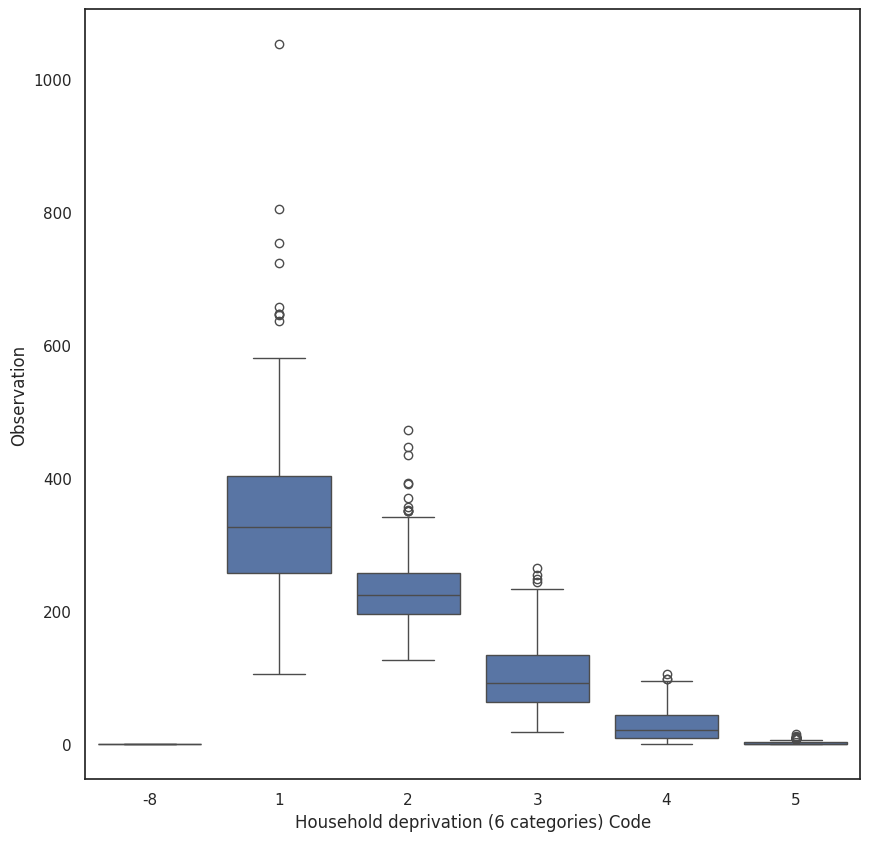

In [121]:
#Draw a boxplot to visualize the data，identify the outlier.
plt.figure(figsize=(10,10))
sns.boxplot(x='Household deprivation (6 categories) Code', y='Observation', data=deprivation);

In [122]:
#Remove the line that includes -8 and check with head()
deprivation_clean = deprivation[deprivation['Household deprivation (6 categories) Code'] !=-8]
deprivation_clean.head()

,Lower layer Super Output Areas Code,Lower layer Super Output Areas,Household deprivation (6 categories) Code,Household deprivation (6 categories),Observation
1,E01011264,Leeds 011A,1,Household is not deprived in any dimension,253
2,E01011264,Leeds 011A,2,Household is deprived in one dimension,212
3,E01011264,Leeds 011A,3,Household is deprived in two dimensions,92
4,E01011264,Leeds 011A,4,Household is deprived in three dimensions,19
5,E01011264,Leeds 011A,5,Household is deprived in four dimensions,1


In [123]:
#Rename each column for ease of use
deprivation_clean.columns = ['lsoa_code', 'lsoa_name', 'deprivation_code', 'deprivation_category', 'household_count']
deprivation_clean.head()

,lsoa_code,lsoa_name,deprivation_code,deprivation_category,household_count
1,E01011264,Leeds 011A,1,Household is not deprived in any dimension,253
2,E01011264,Leeds 011A,2,Household is deprived in one dimension,212
3,E01011264,Leeds 011A,3,Household is deprived in two dimensions,92
4,E01011264,Leeds 011A,4,Household is deprived in three dimensions,19
5,E01011264,Leeds 011A,5,Household is deprived in four dimensions,1


We can't measure poverty in a region by one category, so for subsequent data analysis, we need to calculate the poverty index in LSOA. Here, different levels of poverty are given to different weights, 0-4 representing increasing levels of poverty. The calculation process is as follows (It's like calculating a weighted average):

In [124]:
#####DeepSeek#####
# The following prompt was used in DeepSeek to help me integrate weighting for deprivation categories.
# "How can I assign weights to categorical codes and put into calculating in Python?"
# The response generated was used to help generate the code below, by mapping weight values:
weights = {1: 0, 2: 1, 3: 2, 4: 3, 5: 4}   #method → category code: weight
deprivation_clean['poverty_score'] = deprivation_clean['deprivation_code'].map(weights) * deprivation_clean['household_count']  # Apply weights to calculate poverty score based on deprivation code and household count

<ipython-input-124-af13b90c1c2d>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deprivation_clean['poverty_score'] = deprivation_clean['deprivation_code'].map(weights) * deprivation_clean['household_count']  # Apply weights to calculate poverty score based on deprivation code and household count


In [125]:
# Group by LSOA and name for aggregation
summary = deprivation_clean.groupby(['lsoa_code', 'lsoa_name']).agg({
    'household_count': 'sum',        # calculate the summary household
    'poverty_score': 'sum'       # calculate the summary poverty score
}).reset_index()

# Calculate the poverty index by division
summary['poverty_index'] = summary['poverty_score'] / summary['household_count']

# Rename the columns for clarity
summary.columns = ['lsoa_code', 'lsoa_name', 'total_households', 'total_poverty_score', 'poverty_index']

# check
print(summary)
summary.head()

     lsoa_code   lsoa_name  total_households  total_poverty_score  \
0    E01011264  Leeds 011A               577                  457   
1    E01011265  Leeds 009A               910                  522   
2    E01011266  Leeds 008A              1139                  405   
3    E01011267  Leeds 009B               723                  570   
4    E01011268  Leeds 010A               631                  636   
..         ...         ...               ...                  ...   
483  E01035050  Leeds 105G               613                  350   
484  E01035051  Leeds 105H               606                  284   
485  E01035052  Leeds 105I               594                  387   
486  E01035053  Leeds 105J               656                  366   
487  E01035054  Leeds 112F              1380                  383   

     poverty_index  
0         0.792028  
1         0.573626  
2         0.355575  
3         0.788382  
4         1.007924  
..             ...  
483       0.570962  
484

,lsoa_code,lsoa_name,total_households,total_poverty_score,poverty_index
0,E01011264,Leeds 011A,577,457,0.792028
1,E01011265,Leeds 009A,910,522,0.573626
2,E01011266,Leeds 008A,1139,405,0.355575
3,E01011267,Leeds 009B,723,570,0.788382
4,E01011268,Leeds 010A,631,636,1.007924


In [126]:
# explore the new summary dataset
summary.describe()

,total_households,total_poverty_score,poverty_index
count,488.000000,488.000000,488.000000
mean,699.729508,526.118852,0.751578
std,136.456703,198.078724,0.240480
min,430.000000,187.000000,0.277536
25%,613.000000,366.000000,0.552543
50%,672.500000,488.000000,0.694986
75%,758.500000,658.250000,0.964469
max,1380.000000,1174.000000,1.416667


In [127]:
# check if any null value exist
summary.isnull().sum()

,0
lsoa_code,0
lsoa_name,0
total_households,0
total_poverty_score,0
poverty_index,0


In [128]:
#import the geojson file
leeds_lsoa=gpd.read_file('https://github.com/YiqiuLu-201886416/Final-Assignment/raw/main/Leeds.geojson')
leeds_lsoa.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   FID       488 non-null    int32   
 1   LSOA21CD  488 non-null    object  
 2   LSOA21NM  488 non-null    object  
 3   BNG_E     488 non-null    int32   
 4   BNG_N     488 non-null    int32   
 5   LONG      488 non-null    float64 
 6   LAT       488 non-null    float64 
 7   GlobalID  488 non-null    object  
 8   geometry  488 non-null    geometry
dtypes: float64(2), geometry(1), int32(3), object(3)
memory usage: 28.7+ KB


In [129]:
leeds_lsoa.head()

,FID,LSOA21CD,LSOA21NM,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,10720,E01011264,Leeds 011A,420937,441836,-1.68306,53.87232,14a73329-fc8f-464c-a4fa-1963baa35500,"POLYGON ((421248.688 442315.812, 421284.072 44..."
1,10721,E01011265,Leeds 009A,418988,441951,-1.71269,53.87343,eda471dd-f408-4dab-917e-c5e188310b35,"POLYGON ((418635 442559, 418637.555 442552.869..."
2,10722,E01011266,Leeds 008A,417489,442615,-1.73545,53.87945,286c32c5-ef49-4ecc-a45e-57630c165c62,"POLYGON ((417783.688 443382.312, 417788.688 44..."
3,10723,E01011267,Leeds 009B,419641,442025,-1.70276,53.87407,318cfaa3-9f08-4d61-a30e-82e903f3a7ba,"POLYGON ((419607.843 442388.568, 419612.752 44..."
4,10724,E01011268,Leeds 010A,420224,441935,-1.69390,53.87324,049e79f0-cd9e-47dc-848b-b6d6fa6825ac,"POLYGON ((420442.406 442436.687, 420443.313 44..."


In [130]:
# Link the two datasets together by the column with the same content, it is to give the spatial attribute.
leeds_poverty=leeds_lsoa.merge(summary, how='left',left_on='LSOA21CD',right_on='lsoa_code')
print(leeds_poverty)

       FID   LSOA21CD    LSOA21NM   BNG_E   BNG_N     LONG       LAT  \
0    10720  E01011264  Leeds 011A  420937  441836 -1.68306  53.87232   
1    10721  E01011265  Leeds 009A  418988  441951 -1.71269  53.87343   
2    10722  E01011266  Leeds 008A  417489  442615 -1.73545  53.87945   
3    10723  E01011267  Leeds 009B  419641  442025 -1.70276  53.87407   
4    10724  E01011268  Leeds 010A  420224  441935 -1.69390  53.87324   
..     ...        ...         ...     ...     ...      ...       ...   
483  33045  E01035050  Leeds 105G  430214  426790 -1.54344  53.73664   
484  33046  E01035051  Leeds 105H  431335  427174 -1.52641  53.74003   
485  33047  E01035052  Leeds 105I  431014  426532 -1.53134  53.73427   
486  33048  E01035053  Leeds 105J  432010  426253 -1.51627  53.73171   
487  33049  E01035054  Leeds 112F  430907  432531 -1.53237  53.78820   

                                 GlobalID  \
0    14a73329-fc8f-464c-a4fa-1963baa35500   
1    eda471dd-f408-4dab-917e-c5e188310b35   


In [131]:
# An initial view about the dataset by using .explore()，viridis is friendly to colorblind.
leeds_poverty.explore('poverty_index',cmap='viridis',style_kwds={'fillOpacity': 1.0})

## ***Crime part***
The crime data comes from the official website (https://data.police.uk/), which contains data on the streets of West Yorkshire in March 2025 in LSOA (2021). There are a total of 26,126 crime cases.The dataset also shows information about the latitude, longitude and addresses of the crime cases.
In addition to this, the dataset also includes the reported agency, the outcome, and the type of crime. According to the information provided by the official, the 'Context' column is all empty, so drop it first.


In [132]:
#Read the crime data stored in github and use head to view the first five lines.
crime = pd.read_csv('https://github.com/YiqiuLu/201886416/raw/main/2025-03-west-yorkshire-street.csv')
crime.head()

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Context
0,5710fc8587927df0c8c205ed8bb4b65b387efcd2e10ebc...,2025-03,West Yorkshire Police,West Yorkshire Police,-1.356632,53.589279,On or near Common Road,E01007328,Barnsley 006A,Public order,Under investigation,NaN
1,NaN,2025-03,West Yorkshire Police,West Yorkshire Police,-1.411821,53.512873,On or near Hemingfield Road,E01007456,Barnsley 029D,Anti-social behaviour,NaN,NaN
2,f824de39c492918a780b7beb5e5e31bba98c9224dde3ac...,2025-03,West Yorkshire Police,West Yorkshire Police,-1.868104,53.935428,On or near Lumb Gill Lane,E01010646,Bradford 001A,Burglary,Investigation complete; no suspect identified,NaN
3,a91e8c35900c36748616b821eaba06e976c99d0a69558e...,2025-03,West Yorkshire Police,West Yorkshire Police,-1.880138,53.945417,On or near Aynholme Drive,E01010646,Bradford 001A,Vehicle crime,Under investigation,NaN
4,7ebd40437579f14b2601708e0b703b295343b0a39a06ef...,2025-03,West Yorkshire Police,West Yorkshire Police,-1.882138,53.944232,On or near Parking Area,E01010646,Bradford 001A,Violence and sexual offences,Under investigation,NaN


In [133]:
#Get to know the crime data information
crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26126 entries, 0 to 26125
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Crime ID               23883 non-null  object 
 1   Month                  26126 non-null  object 
 2   Reported by            26126 non-null  object 
 3   Falls within           26126 non-null  object 
 4   Longitude              25910 non-null  float64
 5   Latitude               25910 non-null  float64
 6   Location               26126 non-null  object 
 7   LSOA code              25910 non-null  object 
 8   LSOA name              25910 non-null  object 
 9   Crime type             26126 non-null  object 
 10  Last outcome category  23883 non-null  object 
 11  Context                0 non-null      float64
dtypes: float64(3), object(9)
memory usage: 2.4+ MB


Because the context is empty, you must drop columns, and you can't just use dropna( ), otherwise you will lose all data. After drop Context, we can use dropna( ) to delete the empty row.

In [134]:
#Drop the Context column due to it is empty.
crime=crime.drop(columns=['Context'])
crime.head()

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category
0,5710fc8587927df0c8c205ed8bb4b65b387efcd2e10ebc...,2025-03,West Yorkshire Police,West Yorkshire Police,-1.356632,53.589279,On or near Common Road,E01007328,Barnsley 006A,Public order,Under investigation
1,NaN,2025-03,West Yorkshire Police,West Yorkshire Police,-1.411821,53.512873,On or near Hemingfield Road,E01007456,Barnsley 029D,Anti-social behaviour,NaN
2,f824de39c492918a780b7beb5e5e31bba98c9224dde3ac...,2025-03,West Yorkshire Police,West Yorkshire Police,-1.868104,53.935428,On or near Lumb Gill Lane,E01010646,Bradford 001A,Burglary,Investigation complete; no suspect identified
3,a91e8c35900c36748616b821eaba06e976c99d0a69558e...,2025-03,West Yorkshire Police,West Yorkshire Police,-1.880138,53.945417,On or near Aynholme Drive,E01010646,Bradford 001A,Vehicle crime,Under investigation
4,7ebd40437579f14b2601708e0b703b295343b0a39a06ef...,2025-03,West Yorkshire Police,West Yorkshire Police,-1.882138,53.944232,On or near Parking Area,E01010646,Bradford 001A,Violence and sexual offences,Under investigation


In [135]:
crime=crime.dropna()

In [136]:
# Check the null values
crime.isnull().sum()

,0
Crime ID,0
Month,0
Reported by,0
Falls within,0
Longitude,0
Latitude,0
Location,0
LSOA code,0
LSOA name,0
Crime type,0


**Note: Our study focus on  LSOA in Leeds**

In [137]:
#Filter rows where 'LSOA name' contains 'Leeds'.
wholecrime1=crime.loc[crime['LSOA name'].str.contains('Leeds')]
wholecrime1.describe()

,Longitude,Latitude
count,8545.000000,8545.000000
mean,-1.550388,53.804096
std,0.071745,0.034833
min,-1.780310,53.714960
25%,-1.596589,53.790724
50%,-1.544831,53.801555
75%,-1.514365,53.817397
max,-1.324698,53.941177


In [138]:
leeds_lsoa.describe()

,FID,BNG_E,BNG_N,LONG,LAT
count,488.000000,488.000000,488.000000,488.000000,488.000000
mean,13058.920082,429745.625000,434948.334016,-1.549768,53.809959
std,6290.620828,5765.760679,4842.130100,0.087553,0.043536
min,10720.000000,415777.000000,424017.000000,-1.761510,53.711780
25%,10841.750000,425662.500000,432060.750000,-1.611580,53.784145
50%,10963.500000,429497.000000,434871.000000,-1.553585,53.809380
75%,11085.250000,433151.750000,437635.000000,-1.498177,53.834153
max,33049.000000,444141.000000,449492.000000,-1.330510,53.940040


In order to compare the latitude and longitude coordinates of the crime point with Leeds LSOA, and to check for abnormal markers. The latitude and longitude of all crime data are selected to be visualized. After check, the difference between the mean, minimum, and maximum values is less than 0.02, so it is ignored and considered to be no outliers.

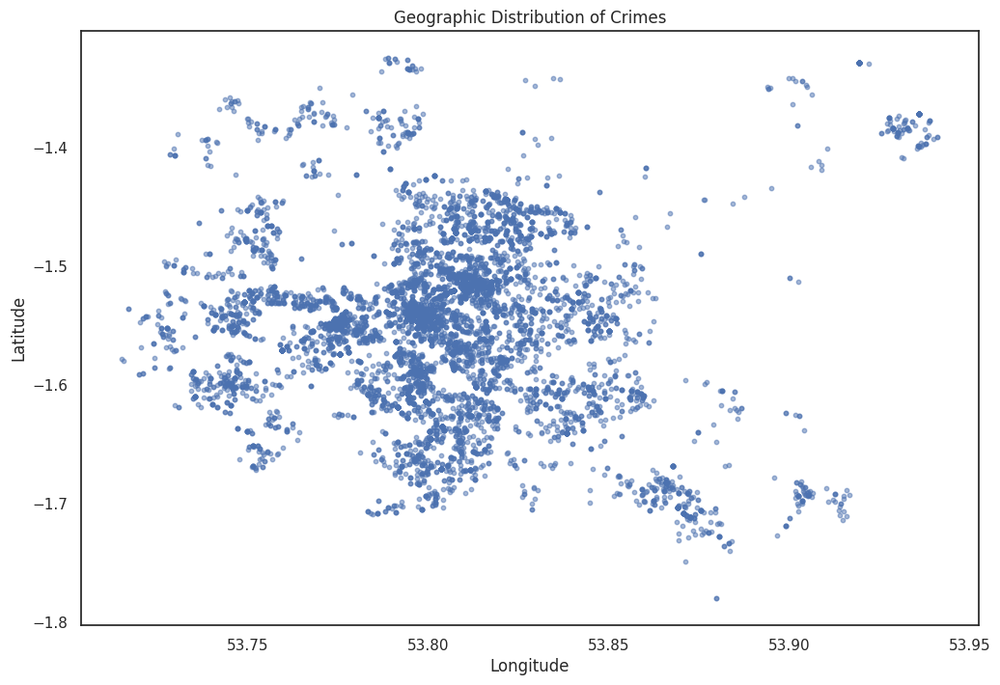

In [139]:
# Set the plot size
plt.figure(figsize=(12, 8))
# Draw crime points by latitude and longitude
plt.scatter(wholecrime1['Latitude'], wholecrime1['Longitude'], alpha=0.5, s=10)
# Set the X-axis & Y-axis label
plt.xlabel('Longitude')
plt.ylabel('Latitude')
#Title
plt.title('Geographic Distribution of Crimes')
plt.show()



---

In below cells, the number of crimes located in each LSOA was calculated.
For this analysis, we focused mainly on the relationship between the number of crimes and the poverty index, rather than the type of crime, which is also a limitation that can be further optimized in future data analysis.

I also cleaned up the columns that have little to do with our data analysis, such as Crime ID, Month, Publisher, etc., and only kept the LSOA code for subsequent connections to geojson, as well as the number of crimes and LSOA name. The use of the agg( ) function can realize data aggregation and data cleaning at the same time in one step, which improves the efficiency of processing.

In [140]:
crime_1 = crime.groupby('LSOA code').agg({
    'Crime type': 'size',  # size to count crimes per LSOA
    'LSOA name': 'first',  # keep the name of each LSOA，avoid the repeat LSOA
}).reset_index()

crime_1.columns = ['LSOA code', 'Crime_Count', 'LSOA name']

In [141]:
crime_1.head()

,LSOA code,Crime_Count,LSOA name
0,E01007328,1,Barnsley 006A
1,E01010568,9,Bradford 016A
2,E01010569,16,Bradford 016B
3,E01010570,6,Bradford 018A
4,E01010571,42,Bradford 016C


In [142]:
#Filter Leeds Crime Case
leedscrime1=crime_1.loc[crime_1['LSOA name'].str.contains('Leeds')]
leedscrime1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 482 entries, 680 to 1399
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   LSOA code    482 non-null    object
 1   Crime_Count  482 non-null    int64 
 2   LSOA name    482 non-null    object
dtypes: int64(1), object(2)
memory usage: 15.1+ KB


In [143]:
# Link the two datasets together by the column with the same content, it is to give the spatial attribute.
leeds_crime2=leeds_lsoa.merge(leedscrime1, how='left',left_on='LSOA21CD',right_on='LSOA code')
leeds_crime2.head()
leeds_crime2.describe()

,FID,BNG_E,BNG_N,LONG,LAT,Crime_Count
count,488.000000,488.000000,488.000000,488.000000,488.000000,482.000000
mean,13058.920082,429745.625000,434948.334016,-1.549768,53.809959,17.728216
std,6290.620828,5765.760679,4842.130100,0.087553,0.043536,33.353689
min,10720.000000,415777.000000,424017.000000,-1.761510,53.711780,1.000000
25%,10841.750000,425662.500000,432060.750000,-1.611580,53.784145,6.000000
50%,10963.500000,429497.000000,434871.000000,-1.553585,53.809380,12.000000
75%,11085.250000,433151.750000,437635.000000,-1.498177,53.834153,22.000000
max,33049.000000,444141.000000,449492.000000,-1.330510,53.940040,661.000000


There are six areas without crime count, so we need to drop them to let the subsequent modelling work. We will merge it back when we do spatial visualization.

In [144]:
leeds_crime2.isnull().sum()

,0
FID,0
LSOA21CD,0
LSOA21NM,0
BNG_E,0
BNG_N,0
LONG,0
LAT,0
GlobalID,0
geometry,0
LSOA code,6


In [145]:
Leeds_Crime3=leeds_crime2.dropna()
Leeds_Crime3.info()
print(Leeds_Crime3)
Leeds_Crime3.describe()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 482 entries, 0 to 487
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   FID          482 non-null    int32   
 1   LSOA21CD     482 non-null    object  
 2   LSOA21NM     482 non-null    object  
 3   BNG_E        482 non-null    int32   
 4   BNG_N        482 non-null    int32   
 5   LONG         482 non-null    float64 
 6   LAT          482 non-null    float64 
 7   GlobalID     482 non-null    object  
 8   geometry     482 non-null    geometry
 9   LSOA code    482 non-null    object  
 10  Crime_Count  482 non-null    float64 
 11  LSOA name    482 non-null    object  
dtypes: float64(3), geometry(1), int32(3), object(5)
memory usage: 43.3+ KB
       FID   LSOA21CD    LSOA21NM   BNG_E   BNG_N     LONG       LAT  \
0    10720  E01011264  Leeds 011A  420937  441836 -1.68306  53.87232   
1    10721  E01011265  Leeds 009A  418988  441951 -1.71269  53.87343  

,FID,BNG_E,BNG_N,LONG,LAT,Crime_Count
count,482.000000,482.000000,482.000000,482.000000,482.000000,482.000000
mean,13084.518672,429714.850622,434868.477178,-1.550244,53.809243,17.728216
std,6325.502730,5764.362052,4813.141992,0.087526,0.043279,33.353689
min,10720.000000,415777.000000,424017.000000,-1.761510,53.711780,1.000000
25%,10841.250000,425661.500000,431966.250000,-1.611700,53.783208,6.000000
50%,10962.500000,429445.500000,434825.500000,-1.554315,53.808960,12.000000
75%,11084.750000,433114.000000,437319.250000,-1.498805,53.831495,22.000000
max,33049.000000,444141.000000,449492.000000,-1.330510,53.940040,661.000000


## ***The process of merging datasets***


In [146]:
#Merge the two datasets together
Merge=Leeds_Crime3.merge(leeds_poverty, how='left',left_on='LSOA21CD',right_on='LSOA21CD')
Merge.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 482 entries, 0 to 481
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   FID_x                482 non-null    int32   
 1   LSOA21CD             482 non-null    object  
 2   LSOA21NM_x           482 non-null    object  
 3   BNG_E_x              482 non-null    int32   
 4   BNG_N_x              482 non-null    int32   
 5   LONG_x               482 non-null    float64 
 6   LAT_x                482 non-null    float64 
 7   GlobalID_x           482 non-null    object  
 8   geometry_x           482 non-null    geometry
 9   LSOA code            482 non-null    object  
 10  Crime_Count          482 non-null    float64 
 11  LSOA name            482 non-null    object  
 12  FID_y                482 non-null    int32   
 13  LSOA21NM_y           482 non-null    object  
 14  BNG_E_y              482 non-null    int32   
 15  BNG_N_y        

In [147]:
Merge.head()

,FID_x,LSOA21CD,LSOA21NM_x,BNG_E_x,BNG_N_x,LONG_x,LAT_x,GlobalID_x,geometry_x,LSOA code,...,BNG_N_y,LONG_y,LAT_y,GlobalID_y,geometry_y,lsoa_code,lsoa_name,total_households,total_poverty_score,poverty_index
0,10720,E01011264,Leeds 011A,420937,441836,-1.68306,53.87232,14a73329-fc8f-464c-a4fa-1963baa35500,"POLYGON ((421248.688 442315.812, 421284.072 44...",E01011264,...,441836,-1.68306,53.87232,14a73329-fc8f-464c-a4fa-1963baa35500,"POLYGON ((421248.688 442315.812, 421284.072 44...",E01011264,Leeds 011A,577,457,0.792028
1,10721,E01011265,Leeds 009A,418988,441951,-1.71269,53.87343,eda471dd-f408-4dab-917e-c5e188310b35,"POLYGON ((418635 442559, 418637.555 442552.869...",E01011265,...,441951,-1.71269,53.87343,eda471dd-f408-4dab-917e-c5e188310b35,"POLYGON ((418635 442559, 418637.555 442552.869...",E01011265,Leeds 009A,910,522,0.573626
2,10722,E01011266,Leeds 008A,417489,442615,-1.73545,53.87945,286c32c5-ef49-4ecc-a45e-57630c165c62,"POLYGON ((417783.688 443382.312, 417788.688 44...",E01011266,...,442615,-1.73545,53.87945,286c32c5-ef49-4ecc-a45e-57630c165c62,"POLYGON ((417783.688 443382.312, 417788.688 44...",E01011266,Leeds 008A,1139,405,0.355575
3,10723,E01011267,Leeds 009B,419641,442025,-1.70276,53.87407,318cfaa3-9f08-4d61-a30e-82e903f3a7ba,"POLYGON ((419607.843 442388.568, 419612.752 44...",E01011267,...,442025,-1.70276,53.87407,318cfaa3-9f08-4d61-a30e-82e903f3a7ba,"POLYGON ((419607.843 442388.568, 419612.752 44...",E01011267,Leeds 009B,723,570,0.788382
4,10724,E01011268,Leeds 010A,420224,441935,-1.69390,53.87324,049e79f0-cd9e-47dc-848b-b6d6fa6825ac,"POLYGON ((420442.406 442436.687, 420443.313 44...",E01011268,...,441935,-1.69390,53.87324,049e79f0-cd9e-47dc-848b-b6d6fa6825ac,"POLYGON ((420442.406 442436.687, 420443.313 44...",E01011268,Leeds 010A,631,636,1.007924


In [148]:
# Drop duplicate columns (' _y') and redundant LSOA
Merge1=Merge.drop(columns=['FID_y','LSOA21NM_y','BNG_E_y','BNG_N_y','LONG_y','LAT_y','GlobalID_y','geometry_y','lsoa_code','lsoa_name','LSOA code','LSOA name'])
Merge1.info()
Merge1.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 482 entries, 0 to 481
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   FID_x                482 non-null    int32   
 1   LSOA21CD             482 non-null    object  
 2   LSOA21NM_x           482 non-null    object  
 3   BNG_E_x              482 non-null    int32   
 4   BNG_N_x              482 non-null    int32   
 5   LONG_x               482 non-null    float64 
 6   LAT_x                482 non-null    float64 
 7   GlobalID_x           482 non-null    object  
 8   geometry_x           482 non-null    geometry
 9   Crime_Count          482 non-null    float64 
 10  total_households     482 non-null    int64   
 11  total_poverty_score  482 non-null    int64   
 12  poverty_index        482 non-null    float64 
dtypes: float64(4), geometry(1), int32(3), int64(2), object(3)
memory usage: 43.4+ KB


,FID_x,LSOA21CD,LSOA21NM_x,BNG_E_x,BNG_N_x,LONG_x,LAT_x,GlobalID_x,geometry_x,Crime_Count,total_households,total_poverty_score,poverty_index
0,10720,E01011264,Leeds 011A,420937,441836,-1.68306,53.87232,14a73329-fc8f-464c-a4fa-1963baa35500,"POLYGON ((421248.688 442315.812, 421284.072 44...",2.0,577,457,0.792028
1,10721,E01011265,Leeds 009A,418988,441951,-1.71269,53.87343,eda471dd-f408-4dab-917e-c5e188310b35,"POLYGON ((418635 442559, 418637.555 442552.869...",38.0,910,522,0.573626
2,10722,E01011266,Leeds 008A,417489,442615,-1.73545,53.87945,286c32c5-ef49-4ecc-a45e-57630c165c62,"POLYGON ((417783.688 443382.312, 417788.688 44...",21.0,1139,405,0.355575
3,10723,E01011267,Leeds 009B,419641,442025,-1.70276,53.87407,318cfaa3-9f08-4d61-a30e-82e903f3a7ba,"POLYGON ((419607.843 442388.568, 419612.752 44...",16.0,723,570,0.788382
4,10724,E01011268,Leeds 010A,420224,441935,-1.69390,53.87324,049e79f0-cd9e-47dc-848b-b6d6fa6825ac,"POLYGON ((420442.406 442436.687, 420443.313 44...",12.0,631,636,1.007924


In [149]:
Merge1.columns=['FID','LSOA21CD','LSOA21NM','BNG_E','BNG_N','LONG','LAT','GlobalID','geometry','Crime_Count','total_households','total_poverty_score','poverty_index']

In [150]:
Merge1.describe()

,FID,BNG_E,BNG_N,LONG,LAT,Crime_Count,total_households,total_poverty_score,poverty_index
count,482.000000,482.000000,482.000000,482.000000,482.000000,482.000000,482.000000,482.000000,482.000000
mean,13084.518672,429714.850622,434868.477178,-1.550244,53.809243,17.728216,700.989627,529.029046,0.754839
std,6325.502730,5764.362052,4813.141992,0.087526,0.043279,33.353689,136.656062,197.543246,0.240152
min,10720.000000,415777.000000,424017.000000,-1.761510,53.711780,1.000000,430.000000,187.000000,0.277536
25%,10841.250000,425661.500000,431966.250000,-1.611700,53.783208,6.000000,613.250000,376.500000,0.555944
50%,10962.500000,429445.500000,434825.500000,-1.554315,53.808960,12.000000,674.500000,491.000000,0.700602
75%,11084.750000,433114.000000,437319.250000,-1.498805,53.831495,22.000000,760.750000,660.500000,0.968333
max,33049.000000,444141.000000,449492.000000,-1.330510,53.940040,661.000000,1380.000000,1174.000000,1.416667


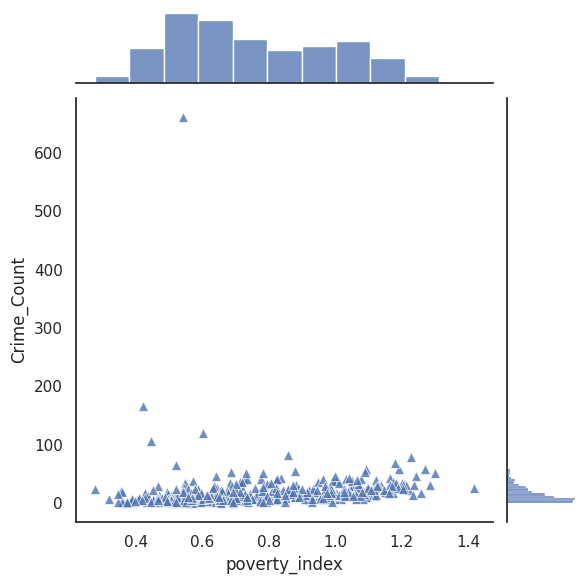

In [151]:
# Jointplot was initially used to visualize the two variables and observe the distribution and characteristics of the data
try1= sns.jointplot(
    data=Merge1,
    x="poverty_index",
    y="Crime_Count",
    height=6,
    alpha=0.8,
    marker='^',
    s=50
)

# **Statistical Modelling**
There are two modelling methods used in the analysis: the first is the Spearman correlation coefficient model and the other is the K-means clustering model.


### ***Spearman's Correlation Coefficient***


First, we use Spearman's correlation coefficient to quantify the association between crime and poverty index, rather than using Pearson. By observing the jointplot, we can identify that the data does not follow the normal distribution, especially for our calculated poverty index, and there exists an outlier value of 661 in the data. However, since 661 represents an actual crime count, it cannot be removed.

In this situation, Spearman's correlation coefficient is more appropriate, as it applies to measurements of monotonic association strength and is a rank statistic independent of data distribution. It doesn't require the data to be linear (Hauke & Kossowski, 2011), making it suitable for this data modelling.


In [152]:
# Calculate the correlation coefficient between the variables
corr_matrix = Merge1[['Crime_Count', 'poverty_index', 'total_households',
                               'total_poverty_score']].corr(method='spearman')
corr_matrix.head()

,Crime_Count,poverty_index,total_households,total_poverty_score
Crime_Count,1.000000,0.568370,0.354844,0.651225
poverty_index,0.568370,1.000000,0.049034,0.882408
total_households,0.354844,0.049034,1.000000,0.483017
total_poverty_score,0.651225,0.882408,0.483017,1.000000


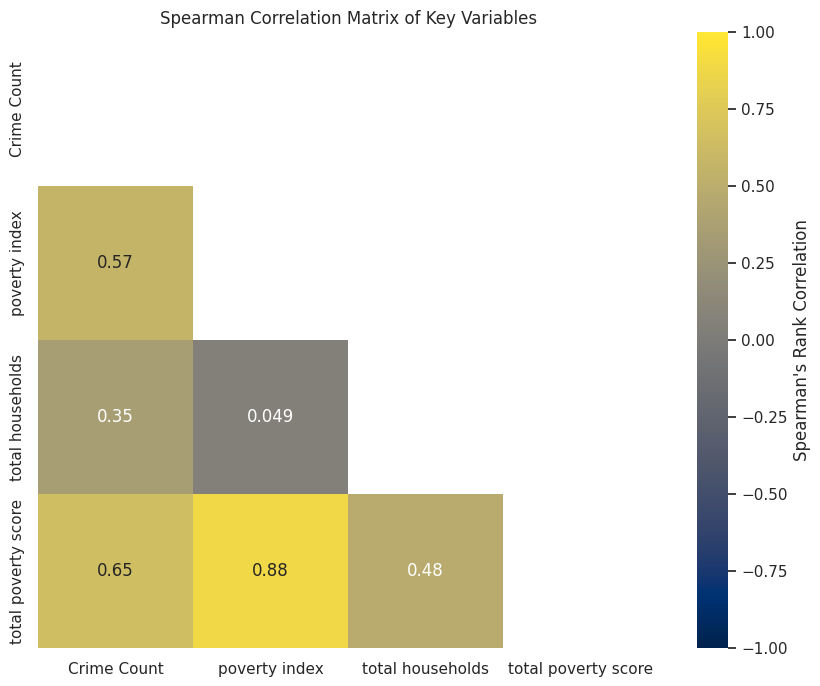

In [153]:
# set plot size
fig, ax = plt.subplots(figsize=(10, 8))
# create a mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix))
# Use column names for labels
labels = corr_matrix.columns.str.replace('_', ' ').str.replace('domain ', '')
# draw heatmap
sns.heatmap(corr_matrix,
            annot=True,            # show values
            cmap='cividis',        # colorblind-friendly
            vmin=-1, vmax=1,       # set color range
            mask=mask,             # apply mask
            xticklabels=labels,    # x labels
            yticklabels=labels,    # y labels
            cbar_kws={'label': "Spearman's Rank Correlation"},  # colorbar label
            ax=ax)
# add title
ax.set(title='Spearman Correlation Matrix of Key Variables')
# show plot
plt.show()

### ***K-means Clustering***

Second, we applied K-means clustering to identify different LSOA characteristics based on crime count and poverty index. K-means is a normal unsupervised technique that helps to better observe the pattern of these two factors. We used the elbow rule and selected a k-value from 1 to 15 to determine the appropriate number of clusters when the slope changes significantly. After the experiment, the K set to 5.

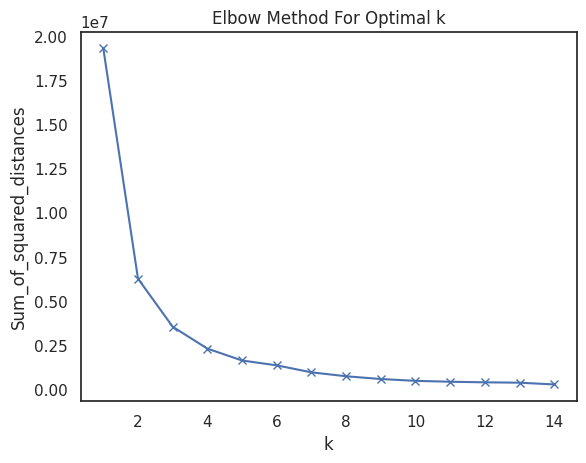

In [154]:
# create an empty list to fill with values later
Sum_of_squared_distances = []

# get a range of numbers from 1 to 15
K = range(1,15)
#for each number in the range 1 to 15
for k in K:
    # create a k-means model with that number of clusters
    # set random state
    km = cluster.KMeans(n_clusters=k, init="random", random_state=123)
    # fit the model using the variables of interest (Crime_Count, poverty_index, total_poverty_score)
    km = km.fit(Merge1[['Crime_Count', 'poverty_index', 'total_poverty_score']].values)
    # calculate the sum of the squared distances and add this to the 'Sum_of_squared_distances' list we created earlier
    Sum_of_squared_distances.append(km.inertia_)

# plot the sum of squared distances against the number of clusters
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [155]:
# run the model with 5 clusters
km5 = cluster.KMeans(n_clusters=5, init="random", random_state=123)
km5cls = km5.fit(Merge1[['Crime_Count', 'poverty_index']].values)

In [156]:
# Check the labels for elements
km5cls.labels_

array([2, 3, 4, 4, 2, 2, 2, 2, 2, 4, 3, 2, 2, 2, 4, 2, 2, 4, 2, 4, 3, 2,
       3, 3, 3, 3, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3,
       4, 2, 4, 4, 4, 4, 2, 4, 2, 3, 2, 4, 4, 4, 2, 4, 2, 2, 2, 2, 2, 2,
       3, 3, 4, 4, 4, 4, 3, 4, 3, 3, 4, 4, 3, 4, 3, 2, 2, 3, 2, 4, 4, 2,
       4, 2, 2, 2, 4, 3, 3, 3, 4, 4, 0, 4, 3, 4, 2, 2, 3, 2, 4, 4, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 4, 2, 2, 2,
       4, 4, 4, 2, 2, 4, 2, 2, 2, 4, 2, 2, 4, 2, 2, 4, 4, 2, 2, 2, 2, 3,
       3, 4, 4, 4, 3, 3, 4, 2, 4, 4, 2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 4, 4, 2, 2, 2, 2, 2, 4, 3, 4, 2, 2, 3, 4, 4, 4, 4,
       4, 3, 4, 2, 2, 4, 4, 4, 4, 4, 4, 2, 2, 4, 4, 4, 2, 4, 2, 4, 4, 2,
       2, 2, 2, 4, 4, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2,
       4, 4, 3, 2, 2, 2, 2, 2, 2, 4, 4, 3, 2, 4, 4, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 4, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2,
       2, 2, 2, 2, 4, 4, 3, 2, 2, 2, 2, 2, 2, 2, 2,

In [157]:
# assign cluster labels to the data
Merge1['Cluster'] = km5cls.labels_
# check last 5 cluster
Merge1['Cluster'].tail()

,Cluster
477,2
478,2
479,2
480,2
481,4


In [158]:
Merge1.head()

,FID,LSOA21CD,LSOA21NM,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Crime_Count,total_households,total_poverty_score,poverty_index,Cluster
0,10720,E01011264,Leeds 011A,420937,441836,-1.68306,53.87232,14a73329-fc8f-464c-a4fa-1963baa35500,"POLYGON ((421248.688 442315.812, 421284.072 44...",2.0,577,457,0.792028,2
1,10721,E01011265,Leeds 009A,418988,441951,-1.71269,53.87343,eda471dd-f408-4dab-917e-c5e188310b35,"POLYGON ((418635 442559, 418637.555 442552.869...",38.0,910,522,0.573626,3
2,10722,E01011266,Leeds 008A,417489,442615,-1.73545,53.87945,286c32c5-ef49-4ecc-a45e-57630c165c62,"POLYGON ((417783.688 443382.312, 417788.688 44...",21.0,1139,405,0.355575,4
3,10723,E01011267,Leeds 009B,419641,442025,-1.70276,53.87407,318cfaa3-9f08-4d61-a30e-82e903f3a7ba,"POLYGON ((419607.843 442388.568, 419612.752 44...",16.0,723,570,0.788382,4
4,10724,E01011268,Leeds 010A,420224,441935,-1.69390,53.87324,049e79f0-cd9e-47dc-848b-b6d6fa6825ac,"POLYGON ((420442.406 442436.687, 420443.313 44...",12.0,631,636,1.007924,2


Preview of our cluster results by calculating the average crime number and poverty index of each cluster and count the number of LSOA in each cluster.

In [159]:
# Calculate summary statistics for each cluster
cluster_features = Merge1.groupby('Cluster').agg({
    'Crime_Count': 'mean',
    'poverty_index': 'mean',
    'LSOA21CD': 'count'
}).round(2)               # Round results to 2 decimal places
print(cluster_features)

         Crime_Count  poverty_index  LSOA21CD
Cluster                                      
0             111.00           0.71         5
1             661.00           0.54         1
2               7.05           0.64       265
3              41.16           0.96        55
4              20.50           0.88       156


According to the poverty and crime data we have explored before, the clusters can be divided into five groups, they are:


*   Cluster 0: High Crime-Moderate-Poverty
*   Cluster 1: Extreme Crime-Low Poverty **(Outlier)**
*   **Cluster 2: Low Crime-Moderate Poverty (Main)**
*   Cluster 3: Medium Crime-Highest Poverty
*   Cluster 4: Low-Medium Crime-High Poverty




# **Data Visualisation**


### ***Spatial Visualisation***
In the previous steps, there was no data for six LSOA, so the data was reaggregated before the spatial visualization to ensure the completeness of the study area.

Compared with the poverty index as the base layer and adding the scatter of crime data, we chose the clustering results to generate the final map. In the clustering map, different categories are given different colors, which can better explain the complex relationship between crime and poverty, and the map is relatively clear. If there are many scattered points, which looks messy.


In [160]:
formap_draft=leeds_lsoa.merge(Merge1, how='left',left_on='LSOA21CD',right_on='LSOA21CD')
# Drop duplicate columns (' _y')
formap=formap_draft.drop(columns=['FID_y','LSOA21NM_y','BNG_E_y','BNG_N_y','LONG_y','LAT_y','GlobalID_y','geometry_y'])
formap.columns=['FID','LSOA21CD','LSOA21NM','BNG_E','BNG_N','LONG','LAT','GlobalID','geometry','Crime_Count','total_households','total_poverty_score','poverty_index','Cluster']
formap.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   FID                  488 non-null    int32   
 1   LSOA21CD             488 non-null    object  
 2   LSOA21NM             488 non-null    object  
 3   BNG_E                488 non-null    int32   
 4   BNG_N                488 non-null    int32   
 5   LONG                 488 non-null    float64 
 6   LAT                  488 non-null    float64 
 7   GlobalID             488 non-null    object  
 8   geometry             488 non-null    geometry
 9   Crime_Count          482 non-null    float64 
 10  total_households     482 non-null    float64 
 11  total_poverty_score  482 non-null    float64 
 12  poverty_index        482 non-null    float64 
 13  Cluster              482 non-null    float64 
dtypes: float64(7), geometry(1), int32(3), object(3)
memory usage: 47.8

In [161]:
formap['display_cluster'] = formap['Cluster'].copy()
#find the missing data and remerge it to formap display_cluster column
missing_data = formap['Cluster'].isna()
# Set the missing data equal to -1
formap.loc[missing_data, 'display_cluster'] = -1

In [162]:
formap.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   FID                  488 non-null    int32   
 1   LSOA21CD             488 non-null    object  
 2   LSOA21NM             488 non-null    object  
 3   BNG_E                488 non-null    int32   
 4   BNG_N                488 non-null    int32   
 5   LONG                 488 non-null    float64 
 6   LAT                  488 non-null    float64 
 7   GlobalID             488 non-null    object  
 8   geometry             488 non-null    geometry
 9   Crime_Count          482 non-null    float64 
 10  total_households     482 non-null    float64 
 11  total_poverty_score  482 non-null    float64 
 12  poverty_index        482 non-null    float64 
 13  Cluster              482 non-null    float64 
 14  display_cluster      488 non-null    float64 
dtypes: float64(8), 

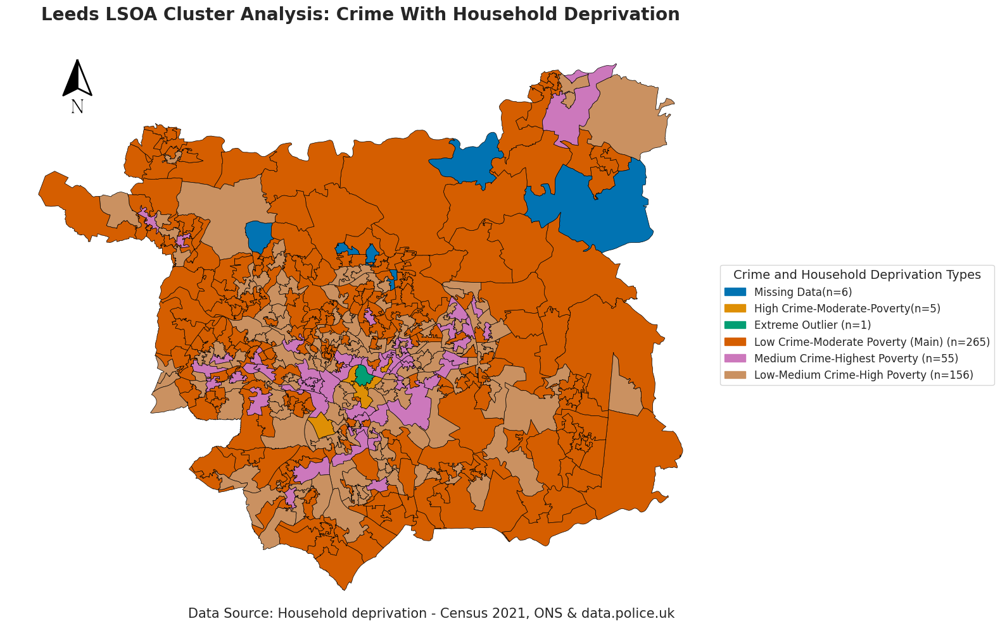

In [163]:
fig, ax = plt.subplots(1, 1, figsize=(15, 12))
#####DeepSeek#####
# The following prompt was used in DeepSeek for colorblind visualization:
# "How to link the colorblind-friendly cmap with legend labels in Python?"
# The response generated was used to help generate the code below, by creating matched color-label pairs and ListedColormap:
# Create colorblind-safe palette with 6 colors
colorblind = sns.color_palette("colorblind", n_colors=6)
# Set cluster categories with colors and labels
cluster = [
    ('Missing Data(n=6)', colorblind[0]),
    ('High Crime-Moderate-Poverty(n=5)', colorblind[1]),
    ('Extreme Outlier (n=1)', colorblind[2]),
    ('Low Crime-Moderate Poverty (Main) (n=265)', colorblind[3]),
    ('Medium Crime-Highest Poverty (n=55)', colorblind[4]),
    ('Low-Medium Crime-High Poverty (n=156)', colorblind[5])
]

labels = [item[0] for item in cluster]   # Extract labels
colors = [item[1] for item in cluster]   # Extract colors
cmap = ListedColormap(colors)  # Create a custom color map
# Create legend matching colors to labels
legend_patches = [patches.Patch(color=color, label=label)
                 for color, label in zip(colors, labels)]

# Draw the map with areas, color by cluster type
formap.plot(column='display_cluster',
           categorical=True,
           cmap=cmap,
           edgecolor='black',
           linewidth=0.5,
           ax=ax)
# Add a legend
ax.legend(handles=legend_patches,
         loc='center left',
         bbox_to_anchor=(1, 0.5),
         title='Crime and Household Deprivation Types',
         fontsize=12,
         title_fontsize=14,
         framealpha=0.8)
# the map title
ax.set_title('Leeds LSOA Cluster Analysis: Crime With Household Deprivation',
             fontsize=20,
             fontweight='bold',
             pad=15)
# North arrow
add_north_arrow(ax, scale=.5, xlim_pos=.1, ylim_pos=.9, color='#000', text_scaler=3, text_yT=-1.5)
# Text about Data Source
ax.text(0.6, 0, 'Data Source: Household deprivation - Census 2021, ONS & data.police.uk',
        ha='center', fontsize=15, transform=ax.transAxes)

ax.axis('off')
plt.show()

### ***Non-Spatial Visualisation***

Joint plot is an effective choice for bivariate non-spatial visualization, as it can show the distribution of data and the relationships between variables at the same time.

Hue = "Cluster" in the code allows us to plot the scatter by category and also show the density of the data distribution (Waskom, no date).

Munzner (2014, p.98) mentioned that the shape of the scatter can be changed to better display the classification attributes, suggesting that it can be crosses or triangles rather than circles, so the visualization uses triangle markers to help distinguish.

Before plotting, I dropped the extreme outliers. If not, the other data points would be compressed, which would disturb the readability of the chart.
In addition, the colorblind population was considered, and the Colorblind Palette was specially applied. The value of the Spearman correlation coefficient and the p-value are also added to the chart, so that the reader can have a more intuitive view of the relationship between the variables.

In [164]:
# Drop the Outlier to better show the non-spatial pattern
max_crime = Merge1['Crime_Count'].max()
Merge2 = Merge1[Merge1['Crime_Count'] != max_crime]

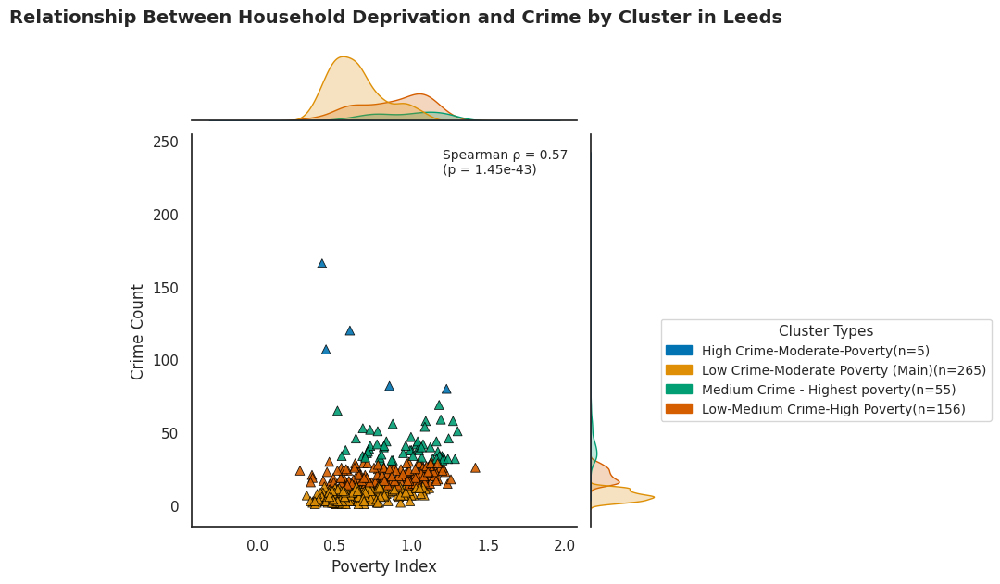

In [165]:
# Define a colorblind-friendly palette by directly using color names
cmap = sns.color_palette("colorblind", n_colors=4)
colors = {
    0: cmap[0],
    2: cmap[1],
    3: cmap[2],
    4: cmap[3]
}

# Create the joint plot
base = sns.jointplot(
    data=Merge2,
    x="poverty_index",
    y="Crime_Count",
    hue="Cluster",
    palette=colors,
    height=6,
    alpha=0.9,
    marker='^',
    s=50,
    edgecolor='black',
)

#####DeepSeek#####
# The following prompt was used in DeepSeek to help me integrate Spearman correlation analysis.
# "How to add Spearman's correlation in seaborn jointplot in Python?"
# The response generated was used to help generate the code below, by using scipy.stats.spearmanr and annotation:
spearman_r, p_value = spearmanr(Merge2['poverty_index'], Merge2['Crime_Count']) # Calculate Spearman correlation and p-value
base.ax_joint.text(
    0.65, 0.9,      # Position (x,y)
    f"Spearman ρ = {spearman_r:.2f}\n(p = {p_value:.2e})", # Text with values
    transform=base.ax_joint.transAxes,   # Use the same coordinate as the jointplot
    fontsize=10,
    bbox=dict(facecolor='white') # the box style
)

# Link the color and label together
labels = [
    patches.Patch(color=colors[0], label='High Crime-Moderate-Poverty(n=5)'),
    patches.Patch(color=colors[2], label='Low Crime-Moderate Poverty (Main)(n=265)'),
    patches.Patch(color=colors[3], label='Medium Crime - Highest poverty(n=55)'),
    patches.Patch(color=colors[4], label='Low-Medium Crime-High Poverty(n=156)')
]
# Using the custom legend
base.ax_joint.legend(
    handles=labels,
    title="Cluster Types",
    bbox_to_anchor=(1.2, 0.4),
    loc='center left',
    fontsize=10,
    title_fontsize=11
)

# Add a title to the jointplot
plt.suptitle(
    "Relationship Between Household Deprivation and Crime by Cluster in Leeds",
    fontsize=14,
    fontweight='bold',
    y=1.05
)
# Set axis labels
base.ax_joint.set_xlabel("Poverty Index")
base.ax_joint.set_ylabel("Crime Count")

plt.show()

# **Limitation**
There is no good temporal correspondence between crime and poverty data, the data sources should be further optimized in future studies. Second, when defining the clustering results, only the average value is referenced, which is flawed.


# **Conclusion**
This analysis uses Python coding language to analyze the relationship between the poverty data and crime data. In the process, we first explore and clean the data. Utilize Spearman correlation coefficient and K-means clustering to do statistical modelling. Finally, the results of the modeling are visualized to explain the complex relationship between poverty and crime. This study can serve policy makers and public good, as well as scholars in related fields.

It's worth noticing that the results of the analysis do not follow the traditional think. From the non-spatial visualization, it presents that poverty does not have a strong positive correlation with crime rate. Based on dropping the extreme outlier, their correlation is 0.57. Looking at the cluster map, most of the districts are low crime, medium poverty type. The areas with the highest poverty rating have a moderate crime rate seems to challenge stereotype.

In conclusion, the following suggestions are given: different management should be applied for different types of LSOA. Flaws should be found in areas with high crime rates and targeted prevention. We should also reject stigmatization, such as the crime rate in poor areas must be high.


# **GenAI Use Acknowledgement**
I acknowledge the use of DeepSeek (DeepSeek, https://chat.deepseek.com/ Accessed 2025-5-11) to assist me with the aspects of weights setting, Cmap link to Labels and Spearman's correlation add.

In the code state, the prompts:

*   "How can I assign weights to categorical codes and put into calculating in Python?"
*   "How to link the colorblind-friendly cmap with legend labels in Python?"
*   "How to add Spearman's correlation in seaborn joint plot in Python?"








# **References**
Hauke, J. and Kossowski, T. 2011. Comparison of Values of Pearson's and Spearman's Correlation Coefficient on the Same Sets of Data. *Quaestiones Geographicae*. [Online]. **30**(2), pp.87-93. [Accessed 12 May 2025]. Available from: https://doi.org/10.2478/v10117-011-0021-1

Munzner, T. 2014. *Visualization Analysis and Design*. [Online]. 1st ed. A K Peters/CRC Press. [Accessed 13 May 2025]. Available from: https://www.perlego.com/book/1605293

Office for National Statistics. 2021. Households by deprivation dimensions. *Office for National Statistics*. [Online]. [Accessed 10 May 2025]. Available from: https://www.ons.gov.uk/datasets/TS011/editions/2021/versions/6


Single Online Home National Digital Team. 2025. ASB Incidents, Crime and Outcomes. *Single Online Home National Digital Team*. [Online]. [Accessed 10 May 2025]. Available from: https://data.police.uk/

Waskom, M. 2025. *seaborn.jointplot*. [Online]. [Accessed 11 May 2025]. Available from: https://seaborn.pydata.org/generated/seaborn.jointplot.html

Wikipedia .2025. *Box plot*. [Online]. [Accessed 11 May 2025]. Available from: https://en.wikipedia.org/wiki/Box_plot